In [1]:
import random
import copy
import numpy as np
import pandas as pd
import torch
import torchvision
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torch.utils.data import DataLoader
from torch import nn
import torch.nn.functional as F
import time

from utilities import scale_bbox, centerwh_to_x1y1wh, x1y1wh_to_centerwh, chw_to_hwc

import json
device = "cuda"

torch.cuda.set_per_process_memory_fraction(1., 0)

In [2]:
torch.cuda.empty_cache() 

# Load Pascal 2012 Data

In [3]:
cats = {
 -1: 'background',
 0: 'pottedplant',
 1: 'boat',
 2: 'bicycle',
 3: 'cat',
 4: 'chair',
 5: 'person',
 6: 'diningtable',
 7: 'car',
 8: 'motorbike',
 9: 'horse',
 10: 'bus',
 11: 'train',
 12: 'bottle',
 13: 'sofa',
 14: 'cow',
 15: 'bird',
 16: 'sheep',
 17: 'aeroplane',
 18: 'dog',
 19: 'tvmonitor'
}

reversed_cats = dict(zip(cats.values(),cats.keys()))

In [4]:
import torchvision.transforms.functional as transforms

HEIGHT, WIDTH = 224, 224

def custom_test_tranforms(img, target):
    '''
    Applies transformations to the image and the target resprectively.
    '''
    new_img = transforms.to_tensor(img)
    new_target = target
    objects = target['annotation']['object']
    new_target = []
    for obj in objects:
        voc_bb = obj['bndbox']
        bb = [int(voc_bb['xmin']),
                int(voc_bb['ymin']),
                int(voc_bb['xmax'])-int(voc_bb['xmin']), 
                int(voc_bb['ymax'])-int(voc_bb['ymin'])
               ]
        scaled_bb = scale_bbox(new_img, bb, HEIGHT, WIDTH) #scale and normalize
        new_entry = x1y1wh_to_centerwh(scaled_bb, single_img=True)
        
        new_entry.append(reversed_cats[obj['name']])
        new_target.append(new_entry)
    new_img = transforms.resize(new_img, (HEIGHT, WIDTH))
    new_img = transforms.normalize(new_img, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    return new_img, new_target

def custom_train_tranforms(img, target):
    '''
    Applies transformations to the image and the target resprectively.
    '''
    new_img = transforms.to_tensor(img)
    new_target = target
    objects = target['annotation']['object']
    new_target = []
    for obj in objects:
        voc_bb = obj['bndbox']
        bb = [int(voc_bb['xmin']),
                int(voc_bb['ymin']),
                int(voc_bb['xmax'])-int(voc_bb['xmin']), 
                int(voc_bb['ymax'])-int(voc_bb['ymin'])
               ]
        scaled_bb = scale_bbox(new_img, bb, HEIGHT, WIDTH) #scale and normalize
        new_entry = x1y1wh_to_centerwh(scaled_bb, single_img=True)
        
        new_entry.append(reversed_cats[obj['name']])
        new_target.append(new_entry)
    new_img = transforms.resize(new_img, (HEIGHT, WIDTH))
    
    
    #new_img = transforms.adjust_contrast(new_img, 0.8+random.random()*.4)
    #new_img = transforms.adjust_brightness(new_img, 0.8+random.random()*.4)
    #new_img = transforms.adjust_saturation(new_img, 0.8+random.random()*.4)
    #new_img = transforms.adjust_hue(new_img, -.1 + random.random()*.2)
    #jit = torchvision.transforms.ColorJitter(brightness=.2, contrast=.2, saturation=.2, hue=.2)
    #new_img = jit(new_img)
    if random.random() < 0.5:
        new_img, new_target = horizontal_flip(new_img, new_target)
    
    new_img = transforms.normalize(new_img, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    return new_img, new_target

def horizontal_flip(images, targets):
    images = torch.flip(images, [-1])
    targets = torch.Tensor(targets)
    targets[:, 0] = 1 - targets[:, 0]
    return images, targets.tolist()

def collate_fn(batch):
    '''
    Custom collection function that transforms a list of tuples (img, target) 
    into a tuple of lists/tensors (imgs, bb, class)
    '''
    x = [b[0] for b in batch]
    x = torch.stack(x, dim=0)
    gt = [torch.Tensor([obj[:4] for obj in b[1]]) for b in batch]

    c = [torch.Tensor([obj[4] for obj in b[1]]) for b in batch]
    return (x, gt, c)

def denormalize(img):
    img = transforms.normalize(img, (-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225))
    return img


In [5]:
PATH = '/home/florian/data/'
train_data = torchvision.datasets.VOCDetection(PATH, transforms=custom_train_tranforms, image_set='train')
val_data = torchvision.datasets.VOCDetection(PATH, transforms=custom_test_tranforms, image_set='val')

train_loader = DataLoader(train_data, batch_size=128, shuffle=True, collate_fn=collate_fn, drop_last=True)
val_loader = DataLoader(val_data, batch_size=128, shuffle=True, collate_fn=collate_fn, drop_last=True)

In [6]:
batch = next(iter(train_loader))

In [7]:
batch[1][0].shape, batch[2][0].shape, batch[1][1].shape, batch[2][1].shape

(torch.Size([11, 4]), torch.Size([11]), torch.Size([6, 4]), torch.Size([6]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


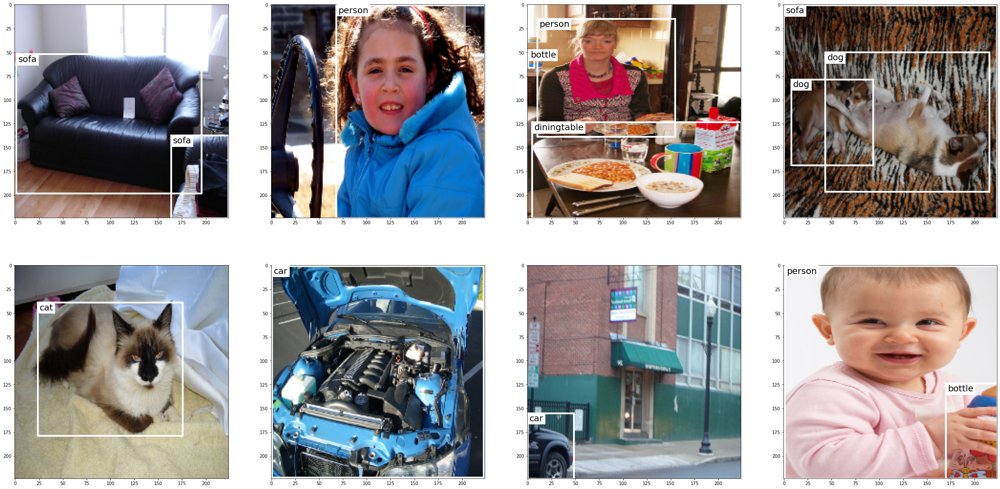

In [8]:
batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(40,20))
axes = axes.flatten()
for i in range(len(batch[0]))[:8]:
        
    img, bbs, classes = batch[0][i], centerwh_to_x1y1wh(batch[1][i]), batch[2][i]
    axes[i].imshow(chw_to_hwc(denormalize(img.squeeze())))
    for bb, cls in zip(bbs,classes):
        bb = bb*224
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='white', facecolor='none')
        axes[i].add_patch(rect)
        cat = axes[i].text(bb[0]+2, bb[1]+8, cats[int(cls)], c='black', size=20, bbox=dict(facecolor='white', edgecolor='none'))
plt.show()


# Anchor Boxes

In [6]:
anchor_grid = [7, 4, 2, 1] # corresponds to the output of output conv layers (7x7, ..., 1x1)
anchor_zooms = [0.7, 1.0, 1.3] # zoom levels for boxes defined by grid
anchor_ratios = [(1.0, 1.0), (1.0, 0.5), (0.5, 1.0)] # ratios for boxes defined by grid

anchor_scales = [(anc*h, anc*w) for anc in anchor_zooms for (h,w) in anchor_ratios]
anchor_offsets = [1/(2*o) for o in anchor_grid]
k = len(anchor_scales) # number of boxes per box given by grid

# anchor center x-values
anchor_x = [np.repeat(np.linspace(ao, 1-ao, ag), ag) for (ao, ag) in zip(anchor_offsets, anchor_grid)]
anchor_x = np.concatenate(anchor_x)

# anchor center y-values
anchor_y = [np.tile(np.linspace(ao, 1-ao, ag), ag) for ao,ag in zip(anchor_offsets, anchor_grid)]
anchor_y = np.concatenate(anchor_y)

anchor_centers = np.repeat(np.stack([anchor_x, anchor_y], axis=1), k, axis=0)


#calulate anchors widhts and heights
anchor_sizes  = [np.array([[w/ag, h/ag] for _ in range(ag**2) for w, h in anchor_scales])
                 for ag in anchor_grid]
anchor_sizes = np.concatenate(anchor_sizes)

anchors = np.concatenate([anchor_centers, anchor_sizes], axis=1)
anchors = torch.from_numpy(anchors).float()
anchors = anchors.to(device)


# IoU - Intersection over Union

In [7]:
def center_to_minmax(bb) -> float:
    """
    Convert from (cx, cy, w, h) to (x1, y1, x2, xy) where (x1, y1) is the top left corner and 
    (x2, y2) the right down corner
    """
    xmin = bb[:, 0] - 0.5 * bb[:, 2]
    xmax = bb[:, 0] + 0.5 * bb[:, 2]

    ymin = bb[:, 1] - 0.5 * bb[:, 3]
    ymax = bb[:, 1] + 0.5 * bb[:, 3]
    return torch.stack([xmin, ymin, xmax, ymax], dim=1)


def intersection(bb_a: torch.Tensor, bb_b: torch.Tensor) -> float:
    temp_bb_a = center_to_minmax(bb_a)
    temp_bb_b = center_to_minmax(bb_b)
    
    bb_a_x1 = temp_bb_a[:, 0]
    bb_a_y1 = temp_bb_a[:, 1]
    bb_a_x2 = temp_bb_a[:, 2]
    bb_a_y2 = temp_bb_a[:, 3]
    
    bb_b_x1 = temp_bb_b[ :, 0]
    bb_b_y1 = temp_bb_b[ :, 1]
    bb_b_x2 = temp_bb_b[ :, 2]
    bb_b_y2 = temp_bb_b[ :, 3]
    
    x1 = torch.max(bb_a_x1[:, None], bb_b_x1[None, :])
    y1 = torch.max(bb_a_y1[:, None], bb_b_y1[None, :])
    
    x2 = torch.min(bb_a_x2[:, None], bb_b_x2[None, :])
    y2 = torch.min(bb_a_y2[:, None], bb_b_y2[None, :])
    
    xy_1 = torch.stack((x1,y1), dim=2)
    xy_2 = torch.stack((x2,y2), dim=2)
    inter_own = torch.clamp(xy_2-xy_1, min=0)
    return inter_own[:, :, 0] * inter_own[:, :, 1]
   

def bb_area(bb: torch.Tensor) -> float:
    return bb[:, 2] * bb[:, 3]


def iou(bb_a, bb_b):
    '''
    Calculates the iou (Intersection over Union)/Jaccard Index of two bounding boxes
    '''
    inter = intersection(bb_a, bb_b)
    union = bb_area(bb_a).unsqueeze(1) + bb_area(bb_b).unsqueeze(0) - inter
    return inter / union
    

# Model Architecture - few anchor boxes

In [8]:
n_cats = len(cats)

def flatten_conv(x,k=9):
    '''Flatten prediction to format --> batchsize, bbox, prediction'''
    bs,nr_filter,w,h = x.size()

    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs,-1,nr_filter//k)

from torch import nn
class SSD_Tail(torch.nn.Module):
    def __init__(self, k, p=[.2,.5]):
        super().__init__()
        self.k = k
        self.p = p
        print(self.p)
        self.do0 = nn.Dropout(self.p[0])
        self.conv1 = nn.Conv2d(512, 256, stride=1, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(256)
        self.do1 = nn.Dropout(self.p[1])
        
        self.conv2 = nn.Conv2d(256, 256, stride=1, kernel_size=3, padding=1, bias=False) #7x7
        self.bn2 = nn.BatchNorm2d(256)
        self.do2 = nn.Dropout(self.p[1])
        
        self.conv3 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #4x4
        self.bn3 = nn.BatchNorm2d(256)
        self.do3 = nn.Dropout(self.p[1])
        
        self.conv4 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #2x2
        self.bn4 = nn.BatchNorm2d(256)
        self.do4 = nn.Dropout(self.p[1])
        
        self.conv5 = nn.Conv2d(256, 256, stride=2, kernel_size=3, padding=1, bias=False) #1x1
        self.bn5 = nn.BatchNorm2d(256)
        self.do5 = nn.Dropout(self.p[1])
        
        #Out Convs
        self.oconv1 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv2 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv3 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv4 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv5 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv6 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
        
        self.oconv7 = nn.Conv2d(256, (n_cats)*self.k, stride = 1, kernel_size = 3, padding=1)
        self.oconv8 = nn.Conv2d(256, 4*self.k, stride = 1, kernel_size = 3,padding=1)
    def forward(self, inputs):
        x = self.do0(inputs)
        x = self.conv1(x)
        x = self.bn1(x)
        x = nn.functional.relu(x)
        x = self.do1(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = nn.functional.relu(x)
        x = self.do2(x)
        o1 = flatten_conv(self.oconv1(x), self.k),flatten_conv(self.oconv2(x), self.k)
        
        x = self.conv3(x)
        x = self.bn3(x)
        x = nn.functional.relu(x)
        x = self.do3(x)
        o2 = flatten_conv(self.oconv3(x), self.k),flatten_conv(self.oconv4(x), self.k)
        
        x = self.conv4(x)
        x = self.bn4(x)
        x = nn.functional.relu(x)
        x = self.do4(x)
        
        o3 = flatten_conv(self.oconv5(x), self.k),flatten_conv(self.oconv6(x), self.k)
        x = self.conv5(x)
        x = self.bn5(x)
        x = nn.functional.relu(x)
        x = self.do5(x)
        o4 = flatten_conv(self.oconv7(x), self.k),flatten_conv(self.oconv8(x), self.k)

        return torch.cat((o1[0], o2[0], o3[0], o4[0]), dim=1), torch.cat((o1[1], o2[1], o3[1], o4[1]), dim=1)
    
    
    
class SSD_model(nn.Module):
    def __init__(self, k, p=[.2,.5]):
        super().__init__()
        self.backbone = torch.nn.Sequential(*list(torchvision.models.resnet34(pretrained=True).children())[:-2])
        self.SSD_tail = SSD_Tail(k, p)
        self.bb_is_trainable = True
        
    def forward(self, inputs):
        x = self.backbone(inputs)
        return(self.SSD_tail(x))
    
    def freeze_backbone(self, freeze=True):
        
        for param in self.backbone.parameters():
            param.requires_grad = freeze
        self.bb_is_trainable = freeze
        return freeze
        

In [9]:
def loc_transformation(g, d, overlap_idx):
    '''
    According to the Loss Function from the SSD Paper, Equation #2
    g: ground truth box
    d: default (anchor) box
    '''

    g_cx, g_cy, g_w, g_h = g[:,0], g[:,1], g[:,2], g[:,3]
    d_cx, d_cy, d_w, d_h = d[:,0], d[:,1], d[:,2], d[:,3]
        
    return torch.cat([g_cx - d_cx[overlap_idx] / d_w[overlap_idx],
                      (g_cy - d_cy[overlap_idx]) / d_h[overlap_idx],
                      torch.log((g_w / d_w[overlap_idx])),
                      torch.log((g_h / d_h[overlap_idx]))
                     ], dim=1)

In [10]:
def invert_transformation(bb_hat, anchors):
    """
    Invert the transform from "loc_transformation".
    """

    return torch.stack([anchors[:, 0] + bb_hat[:, 0] * anchors[:, 2],
                        anchors[:, 1] + bb_hat[:, 1] * anchors[:, 3],
                        anchors[:, 2] * torch.exp(bb_hat[:, 2]),
                        anchors[:, 3] * torch.exp(bb_hat[:, 3])
                        ], dim=1)

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2, eps=1e-10):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.eps = eps

    def forward(self, preds, target):
        p = torch.sigmoid(preds)
        pt = p * target.float() + (1.0 - p) * (1 - target).float()
        alpha_t = (1.0 - self.alpha) * target.float() + self.alpha * (1 - target).float()
        loss = - 1.0 * torch.pow((1 - pt), self.gamma) * torch.log(pt + self.eps)
        return loss.sum()

def find_overlap(bbox_true, anchors, jaccard_overlap):
    bbox_true = bbox_true.to(device)
    jaccard_tensor = iou(anchors, bbox_true)
    _, max_overlap = torch.max(jaccard_tensor, dim=0)
    #print('jaccard_tensor', jaccard_tensor.shape)
    overlap_list = []   
    for i in range(len(bbox_true)):

        threshold_overlap = (jaccard_tensor[:, i] > jaccard_overlap).nonzero()
        if len(threshold_overlap) > 0:
            threshold_overlap = threshold_overlap[:, 0]
            overlap = torch.cat([max_overlap[i].view(1), threshold_overlap])
            overlap = torch.unique(overlap)     
        else:
            overlap = max_overlap[i].view(1)
        overlap_list.append(overlap)
    return overlap_list

def anchor_centers_to_corners(anchors):
    new_anchors = copy.deepcopy(anchors)
    return torch.clamp(torch.cat((new_anchors[:,:2] - new_anchors[:,2:]/2, new_anchors[:,2:]), dim=-1), min=0, max=1)

def one_hot_encoding(labels, num_classes):
        return torch.eye(num_classes)[labels]
    

def loc_transformation(x, anchors, overlap_indicies):
        # Doing location transformations according to SSD paper
        return torch.cat([(x[:, 0:1] - anchors[overlap_indicies, 0:1]) / anchors[overlap_indicies, 2:3],
                          (x[:, 1:2] - anchors[overlap_indicies, 1:2]) / anchors[overlap_indicies, 3:4],
                          torch.log((x[:, 2:3] / anchors[overlap_indicies, 2:3])),
                          torch.log((x[:, 3:4] / anchors[overlap_indicies, 3:4]))
                         ], dim=1)


class SSD_loss(nn.Module):
    
    def __init__(self, overlap_factor=.6, loc_loss_weight_factor=10):
        super().__init__()
        self.focal_loss = FocalLoss()
        self.overlap_factor = overlap_factor
        self.loc_loss_weight_factor = loc_loss_weight_factor
    
    def forward(self, outputs, targets):
        loc_loss = 0.0
        class_loss = 0.0
        for i in range(len(outputs[0])): # images from batch
            class_pred, loc_pred = outputs[0][i].to(device), outputs[1][i].to(device)
            class_gt, loc_gt = targets[1][i].to(device), targets[0][i].to(device)
            overlaps = find_overlap(loc_gt, anchors, self.overlap_factor)
            
            class_target = torch.zeros(class_pred.shape[0]).float().to(device)
            temp_loc_loss = .0
            for j in range(len(overlaps)):  # bbs in image
                overlap = overlaps[j]
                class_target[overlap] = class_gt[j]
                #print('overlap_list',len(overlaps))
                input_ = loc_pred[overlap, :]
                target_ = loc_transformation(loc_gt[j, :].expand((len(overlap), 4)), anchors, overlap)
                
                temp_loc_loss += F.smooth_l1_loss(input=input_, target=target_, reduction="sum") / len(overlap)
            loc_loss += temp_loc_loss / loc_gt.shape[0] # location loss per ground truth object
            
            class_target = one_hot_encoding(class_target.long(), len(cats)).float().to(device)
            class_loss += self.focal_loss(class_pred, class_target) / loc_gt.shape[0] # classification loss per ground truth object
            
            #if i == 0: print(class_loss)
        loc_loss = loc_loss/len(outputs[0])
        class_loss = class_loss/len(outputs[0])
        loss = class_loss + loc_loss * self.loc_loss_weight_factor

        return loss, loc_loss, class_loss
    
    

    


In [20]:
from tqdm.notebook import tqdm, trange

batch = next(iter(train_loader))
EPOCHS = 1

def train(model, train_loader, val_loader, loss_fn=SSD_loss, save_name='temp', epochs=1, lr=1e-3, wd=1e-2):
    stats = pd.DataFrame(columns=[
        'epoch', 
        'train total loss', 
        'train localization loss', 
        'train classification loss',
        'val mAP',
        'val total loss', 
        'val localization loss', 
        'val classification loss'
    ])
    optim = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    batch = next(iter(val_loader))
    map_metric = MAP(model, batch)
    SSD_loss = loss_fn()
    best_map_score = 0
    best_val_loss = 0
    stats_save_path = './stats/'+save_name+time.strftime('%d-%m-%Y-%H:%M' ,time.localtime())+'.pkl'
    for e in range(epochs):
        t0 = time.time()
        epochlosses = [.0, .0, .0]
        #for i, batch in enumerate(tqdm(train_loader)):
        model.train()
        for i, batch in enumerate(train_loader):
            
            imgs, bbs, classes = batch
            imgs = imgs.to(device)
            preds = model(imgs) # torch.Size([2, 16, 21])
            losses = SSD_loss(preds, (bbs, classes));
            #def forward(self, class_hat, bb_hat, class_true, bb_true):
            '''print('Batch #:', i,
                  ' \n total Batchloss: ', loss.item(),
                  ' \n Localization Batchloss: ', loc_loss.item(),
                  ' \n Classification Batchloss: ', class_loss.item()
                 )'''
            optim.zero_grad()
            losses[0].backward()
            optim.step()
            epochlosses[0] += losses[0]
            epochlosses[1] += losses[1]
            epochlosses[2] += losses[2]
        vallosses = [.0, .0, .0]
        #for i, batch in enumerate(tqdm(val_loader)):
        model.eval()
        for i, batch in enumerate(val_loader):
            
            
            with torch.no_grad():
                imgs, bbs, classes = batch
                imgs = imgs.to(device)
                preds = model(imgs) # torch.Size([2, 16, 21])
                losses = SSD_loss(preds, (bbs, classes));
                
                vallosses[0] += losses[0]
                vallosses[1] += losses[1]
                vallosses[2] += losses[2]
            
        t1 = time.time()
        map_score = map_metric()[1]
        stats.loc[e] = [
            e,
            epochlosses[0].item()/len(train_loader),
            epochlosses[1].item()/len(train_loader),
            epochlosses[2].item()/len(train_loader),
            map_score,
            vallosses[0].item()/len(val_loader),
            vallosses[1].item()/len(val_loader),
            vallosses[2].item()/len(val_loader),
        ]
        if bool(save_name) and map_score>best_map_score:
            best_map_score = map_score
            print('saved model because new best map score at epoch:', e)
            torch.save(model.state_dict(), './models/-best_map-'+save_name+'.pth')
        if bool(save_name) and vallosses[0].item()/len(val_loader)>best_val_loss:
            best_val_loss = vallosses[0].item()/len(val_loader)
            print('saved model because new lowest loss at epoch:', e)
            torch.save(model.state_dict(), './models/-best_loss-'+save_name+'.pth')
        
            
        print('Epoch #:', e,
                  ' \n ----- Training -----',
                  ' \n total Epochloss: ', epochlosses[0].item()/len(train_loader),
                  ' \n Localization Epochloss: ', epochlosses[1].item()/len(train_loader),
                  ' \n Classification Epochloss: ', epochlosses[2].item()/len(train_loader),
                  ' \n ----- Validation -----',
                  ' \n mAP: ', map_score,
                  ' \n total Epochloss: ', vallosses[0].item()/len(val_loader),
                  ' \n Localization Epochloss: ', vallosses[1].item()/len(val_loader),
                  ' \n Classification Epochloss: ', vallosses[2].item()/len(val_loader),
                  ' \n Duration in S: ', int(t1-t0),
            )
        
        stats.to_pickle(stats_save_path)
    return stats





In [18]:
def center_to_minmax(box: torch.Tensor) -> float:
    """
    Converting (cx, cy, w, h) to (x1, y1, x2, y2)
    """

    xmin = box[:, 0] - 0.5 * box[:, 2]
    xmax = box[:, 0] + 0.5 * box[:, 2]

    ymin = box[:, 1] - 0.5 * box[:, 3]
    ymax = box[:, 1] + 0.5 * box[:, 3]
    return torch.stack([xmin, ymin, xmax, ymax], dim=1)


def intersect(box_a: torch.Tensor, box_b: torch.Tensor) -> float:
    # Coverting (cx, cy, w, h) to (x1, y1, x2, y2) since its easier to extract min/max coordinates
    temp_box_a, temp_box_b = center_to_minmax(box_a), center_to_minmax(box_b)

    max_xy = torch.min(temp_box_a[:, None, 2:], temp_box_b[None, :, 2:])
    min_xy = torch.max(temp_box_a[:, None, :2], temp_box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]


def box_area(box: torch.Tensor) -> float:
    return box[:, 2] * box[:, 3]


def jaccard(box_a: torch.Tensor, box_b: torch.Tensor) -> float:
    box_a, box_b = box_a.to(device), box_b.to(device)
    intersection = intersect(box_a, box_b)
    union = box_area(box_a).unsqueeze(1) + box_area(box_b).unsqueeze(0) - intersection
    return intersection / union
def find_overlap(bb_true_i, anchors, jaccard_overlap):
    jaccard_tensor = jaccard(anchors, bb_true_i)
    _, max_overlap = torch.max(jaccard_tensor, dim=0)
    overlap_list = []    
    for i in range(len(bb_true_i)):
        threshold_overlap = (jaccard_tensor[:, i] > jaccard_overlap).nonzero()

        if len(threshold_overlap) > 0:
            threshold_overlap = threshold_overlap[:, 0]
            overlap = torch.cat([max_overlap[i].view(1), threshold_overlap])
            overlap = torch.unique(overlap)     
        else:
            overlap = max_overlap[i].view(1)
        overlap_list.append(overlap)
    return overlap_list


class MAP:
    def __init__(self, model, dataset, jaccard_threshold = 0.5, anchors=anchors):
        self.jaccard_threshold = jaccard_threshold
        self.model = model
        self.eps = np.finfo(np.float32).eps
        self.anchors = anchors
        self.dataset = dataset

    @staticmethod
    def voc_ap(rec, prec):
        """Compute VOC AP given precision and recall with the VOC-07 11-point method."""

        ap = 0.0
        for t in np.arange(0.0, 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0.0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.0

        return ap

    def __call__(self):
        self.model.eval()
        aps = defaultdict(list)

        for i in range(len(self.dataset[0])):
            x, bb_true, class_true = self.dataset[0][i].to(device), self.dataset[1][i].to(device), self.dataset[2][i].to(device)
            class_true = class_true - 1 # -1 to convert it from 1-21 to 0-20
            x = x[None, :, :, :]
            class_hat, bb_hat = self.model(x)
            class_hat = class_hat[0, :, 1:].sigmoid()

            bb_hat = invert_transformation(bb_hat.squeeze(0), self.anchors)
            jacard_values = jaccard(bb_hat.squeeze(0), bb_true)

            for j in range(len(class_true)):
                overlap = (jacard_values[:, j] > self.jaccard_threshold).nonzero()
                class_true_j = int(class_true[j].detach().cpu().numpy())

                if len(overlap) > 0:
                    class_hat_j = class_hat[overlap[:,0], :]
                    prob, class_id = class_hat_j.max(1)
                    prob, sort_index = torch.sort(prob, descending=True)
                    class_id = class_id[sort_index].detach().cpu().numpy()

                    tp = np.zeros_like(class_id)
                    fp = np.zeros_like(class_id)

                    found = False
                    for d in range(len(class_id)):
                        if found or class_id[d] != class_true[j]:
                            fp[d] = 1.0
                        else:
                            tp[d] = 1.0
                            found = True

                    fp = np.cumsum(fp)
                    tp = np.cumsum(tp)

                    rec = tp
                    prec = tp / np.maximum(tp + fp, self.eps)

                    temp_ap = MAP.voc_ap(rec, prec)
                    aps[class_true_j].append(temp_ap)
                else:
                    aps[class_true_j].append(0)

        res_list = []
        for _, list_value in aps.items():
            res_list.append(sum(list_value) / len(list_value))

        return res_list, sum(res_list) / len(res_list)

In [13]:
from collections import namedtuple, defaultdict


In [ ]:
batch = next(iter(val_loader))
map_val = MAP(model, batch)
map_val()

In [ ]:
class_true=torch.empty(0)
len(class_true)

In [ ]:
next(iter(train_loader))[2]

In [ ]:
type(class_pred), type(bb_pred), type(y),type(bb)


In [ ]:
new_y = [x.unsqueeze(0) for x in y]
new_bb = [x.unsqueeze(0) for x in bb]
class_pred.shape, bb_pred.shape, new_y[1].shape, bb[1].shape

In [ ]:
ls = SSDLoss()
ls(class_pred, bb_pred, new_y,new_bb)

In [ ]:
ls = SSD_loss()
ls((class_pred, bb_pred),(bb, y))

#    def forward(self, class_hat, bb_hat, class_true, bb_true):

### Dropout: 0.5 + Weight Decay

In [ ]:
model=SSD_model(k).to(device)

In [ ]:
x,bb,y = next(iter(train_loader))

In [ ]:
len(bb), len(y), bb[0].shape, y[0].shape

In [ ]:
class_pred, bb_pred = model(x.to(device)); class_pred.shape, bb_pred.shape

In [14]:
from collections import defaultdict
class MAP1:
    def __init__(self, model, dataloader, jaccard_threshold, anchors):
        self.jaccard_threshold = jaccard_threshold
        self.model = model
        self.eps = np.finfo(np.float32).eps
        self.anchors = anchors
        self.dataloader = dataloader

    @staticmethod
    def voc_ap(rec, prec):
        """Compute VOC AP given precision and recall with the VOC-07 11-point method."""

        ap = 0.0
        for t in np.arange(0.0, 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0.0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.0
        return ap

    def __call__(self):
        self.model.eval()
        aps = defaultdict(list)
        runs = 0

        for i, batch in enumerate(self.dataloader):
            x, bb_true, class_true = batch
            x = x.to(device)
            bb_true = bb_true
            class_hat, bb_hat = self.model(x)
            class_hat = class_hat[0, :, 1:].sigmoid()

            for k in range(len(x)):
                bb_hat_k = invert_transformation(bb_hat[k].squeeze(0), self.anchors)
                class_true[k] = class_true[k].squeeze(0) - 1 # -1 to convert it from 1-21 to 0-20
                #print(bb_hat.shape, bb_hat[k].shape)
                #print(bb_hat.shape, bb_hat[k].shape, bb_true[k].shape)
                jacard_values = iou(bb_hat_k.to(device), bb_true[k].to(device))
                for j in range(len(class_true[k])):
                    overlap = (jacard_values[:, j] > self.jaccard_threshold).nonzero()

                    class_true_j = int(class_true[k][j].detach().cpu().numpy())
                    runs += 1
                    #print(runs)
                    if len(overlap) > 0:
                        
                        class_hat_j = class_hat[overlap[:,0], :]
                        prob, class_id = class_hat_j.max(1)
                        prob, sort_index = torch.sort(prob, descending=True)
                        class_id = class_id[sort_index].detach().cpu().numpy()
                        #print(class_id)
                        tp = np.zeros_like(class_id)
                        fp = np.zeros_like(class_id)

                        found = False
                        for d in range(len(class_id)):
                            if found or class_id[d] != class_true_j:
                                fp[d] = 1.0
                            else:
                                tp[d] = 1.0
                                found = True

                        fp = np.cumsum(fp)
                        tp = np.cumsum(tp)

                        rec = tp
                        prec = tp / np.maximum(tp + fp, self.eps)

                        temp_ap = self.voc_ap(rec, prec)
                        aps[class_true_j].append(temp_ap)
                    else:
                        aps[class_true_j].append(0)

        res_list = []
        for _, list_value in aps.items():
            res_list.append(sum(list_value) / len(list_value))

        return res_list, sum(res_list) / len(res_list)

für morgen: die jeweils zweite Zelle sind die ergebnisse mit gamma==5

In [29]:
stats = pd.DataFrame(columns=[
    'epoch', 
    'train total loss', 
    'train localization loss', 
    'train classification loss', 
    'val total loss', 
    'val localization loss', 
    'val classification loss'
])

In [46]:
PATH = './models/best_loss-do-10-20-wd-0-150e.pth'

#models/best_loss-do-10-20-wd-0-150e.pth


model=SSD_model(k, p=[0.1,0.2]).to(device)
model.load_state_dict(torch.load(PATH))

[0.1, 0.2]


<All keys matched successfully>

In [47]:
map_metric = MAP(model, batch)

In [45]:
map_metric()

([0.30434782608695654,
  0.3333333333333334,
  0.5454545454545455,
  0.12222222222222223,
  0.8000000000000002,
  0.580357142857143,
  0.1416666666666667,
  0.5365079365079365,
  0.5714285714285715,
  0.8214285714285715,
  0.23611111111111116,
  0.4848484848484848,
  0.5555555555555557,
  0.5555555555555557,
  0.0,
  1.0000000000000002,
  0.5833333333333335,
  0.130952380952381,
  0.025641025641025637,
  0.6666666666666669],
 0.449770546482503)

In [48]:
map_metric()

([0.30434782608695654,
  0.3333333333333334,
  0.5454545454545455,
  0.12222222222222223,
  0.8000000000000002,
  0.580357142857143,
  0.1416666666666667,
  0.5365079365079365,
  0.5714285714285715,
  0.8214285714285715,
  0.23611111111111116,
  0.4848484848484848,
  0.5555555555555557,
  0.5555555555555557,
  0.0,
  1.0000000000000002,
  0.5833333333333335,
  0.130952380952381,
  0.025641025641025637,
  0.6666666666666669],
 0.449770546482503)

In [ ]:
model=SSD_model(k, p=[0.,0.]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-0-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.,0.]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-0-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-10-20-wd-0-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-10-20-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-15-30-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-15-20-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.2,0.4]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-10-20-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [ ]:
model=SSD_model(k, p=[0.2,0.4]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-10-20-wd-1e2-150e')
#PATH = './models/do-10-20-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

In [34]:
from pathlib import Path

In [38]:
DIR = Path('./stats/')
for stat in DIR.iterdir():
    #path = './stats/do-10-20-wd-0-150e10-07-2021-05:13.pkl'
    df = pd.read_pickle(stat)
    print(stat)
    print(df[df['val mAP'] == df['val mAP'].max()])
    print(df[df['val total loss'] == df['val total loss'].min()])
#    print(df.iloc[-1])

stats/do-10-20-wd-1e2-150e10-07-2021-09:01.pkl
    epoch  train total loss  train localization loss  \
61   61.0          3.812157                 0.092447   

    train classification loss   val mAP  val total loss  \
61                   2.887682  0.313971        4.833914   

    val localization loss  val classification loss  
61               0.133449                 3.499418  
    epoch  train total loss  train localization loss  \
89   89.0          3.670995                 0.090479   

    train classification loss   val mAP  val total loss  \
89                   2.766203  0.197246        4.758472   

    val localization loss  val classification loss  
89               0.128106                 3.477412  
stats/do-15-30-wd-1e2-150e09-07-2021-17:50.pkl
     epoch  train total loss  train localization loss  \
130  130.0           3.67441                 0.093178   

     train classification loss   val mAP  val total loss  \
130                   2.742628  0.255157        4.99764

In [20]:
PATH = './models/do-15-30-wd-0-150e.pth'
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [16]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-15-30-wd-0-150e')
#PATH = './models/do-15-30-wd-0-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.15, 0.3]
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  67.6125821200284  
 Localization Epochloss:  0.2821342945098877  
 Classification Epochloss:  64.79121537642045  
 ----- Validation -----  
 mAP:  0.08002224574415644  
 total Epochloss:  14.347268337673611  
 Localization Epochloss:  0.1944933361477322  
 Classification Epochloss:  12.402336968315971  
 Duration in S:  89
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.086504849520597  
 Localization Epochloss:  0.19916584274985574  
 Classification Epochloss:  5.094847245649858  
 ----- Validation -----  
 mAP:  0.10480267045448455  
 total Epochloss:  6.534885660807292  
 Localization Epochloss:  0.15715692308213974  
 Classification Epochloss:  4.963315836588541  
 Duration in S:  89
Epoch #: 2  
 ----- Training -----  
 total Epochloss:  6.33719218860973  
 Localization Epochloss:  0.17474890838969837  
 Classification Epochloss:  4.5897039933638135  
 ----- Validation -----  
 mAP:  0.08311865323342589 

Epoch #: 23  
 ----- Training -----  
 total Epochloss:  3.463838057084517  
 Localization Epochloss:  0.09887604279951616  
 Classification Epochloss:  2.4750770222056997  
 ----- Validation -----  
 mAP:  0.31632819590875644  
 total Epochloss:  5.0361277262369795  
 Localization Epochloss:  0.14549139870537653  
 Classification Epochloss:  3.58121337890625  
 Duration in S:  89
Epoch #: 24  
 ----- Training -----  
 total Epochloss:  3.364233883944425  
 Localization Epochloss:  0.09466136585582387  
 Classification Epochloss:  2.417620225386186  
 ----- Validation -----  
 mAP:  0.28895691193888956  
 total Epochloss:  5.059353976779514  
 Localization Epochloss:  0.15143252478705513  
 Classification Epochloss:  3.5450280083550347  
 Duration in S:  89
Epoch #: 25  
 ----- Training -----  
 total Epochloss:  3.30014350197532  
 Localization Epochloss:  0.09436416625976562  
 Classification Epochloss:  2.3565021861683237  
 ----- Validation -----  
 mAP:  0.2801677735957937  
 tota

Epoch #: 45  
 ----- Training -----  
 total Epochloss:  2.323558807373047  
 Localization Epochloss:  0.07257892326875166  
 Classification Epochloss:  1.5977699973366477  
 ----- Validation -----  
 mAP:  0.29807363363495554  
 total Epochloss:  5.58405524359809  
 Localization Epochloss:  0.15748298433091906  
 Classification Epochloss:  4.009225124782986  
 Duration in S:  89
Epoch #: 46  
 ----- Training -----  
 total Epochloss:  2.3080402721058237  
 Localization Epochloss:  0.07237476110458374  
 Classification Epochloss:  1.584292845292525  
 ----- Validation -----  
 mAP:  0.3386529426108678  
 total Epochloss:  5.3840752495659725  
 Localization Epochloss:  0.1538996590508355  
 Classification Epochloss:  3.845078870985243  
 Duration in S:  89
Epoch #: 47  
 ----- Training -----  
 total Epochloss:  2.294263319535689  
 Localization Epochloss:  0.07334614883769643  
 Classification Epochloss:  1.5608019395308061  
 ----- Validation -----  
 mAP:  0.3053785965071521  
 total

Epoch #: 67  
 ----- Training -----  
 total Epochloss:  1.7773645574396306  
 Localization Epochloss:  0.06258434599096124  
 Classification Epochloss:  1.151521162553267  
 ----- Validation -----  
 mAP:  0.32468054728079393  
 total Epochloss:  5.996768527560764  
 Localization Epochloss:  0.15241012573242188  
 Classification Epochloss:  4.472667100694444  
 Duration in S:  89
Epoch #: 68  
 ----- Training -----  
 total Epochloss:  1.772993434559215  
 Localization Epochloss:  0.061337411403656006  
 Classification Epochloss:  1.1596192446621982  
 ----- Validation -----  
 mAP:  0.36538276512943413  
 total Epochloss:  5.596432834201389  
 Localization Epochloss:  0.14282840092976887  
 Classification Epochloss:  4.168149820963541  
 Duration in S:  89
Epoch #: 69  
 ----- Training -----  
 total Epochloss:  1.7359303561123935  
 Localization Epochloss:  0.06107245792042126  
 Classification Epochloss:  1.1252056468616833  
 ----- Validation -----  
 mAP:  0.32417246645402686  
 

Epoch #: 89  
 ----- Training -----  
 total Epochloss:  1.419949011369185  
 Localization Epochloss:  0.0552860444242304  
 Classification Epochloss:  0.8670884045687589  
 ----- Validation -----  
 mAP:  0.3588249658675221  
 total Epochloss:  6.121181233723958  
 Localization Epochloss:  0.14583634270562065  
 Classification Epochloss:  4.662818060980903  
 Duration in S:  89
Epoch #: 90  
 ----- Training -----  
 total Epochloss:  1.3712064569646663  
 Localization Epochloss:  0.053413651206276634  
 Classification Epochloss:  0.8370699449018999  
 ----- Validation -----  
 mAP:  0.38305598326770884  
 total Epochloss:  5.8882256401909725  
 Localization Epochloss:  0.1391810629102919  
 Classification Epochloss:  4.496415540907118  
 Duration in S:  89
Epoch #: 91  
 ----- Training -----  
 total Epochloss:  1.3697859157215466  
 Localization Epochloss:  0.05341712453148582  
 Classification Epochloss:  0.8356148979880593  
 ----- Validation -----  
 mAP:  0.34257391029716383  
 t

Epoch #: 111  
 ----- Training -----  
 total Epochloss:  1.1462649432095615  
 Localization Epochloss:  0.047976266254078255  
 Classification Epochloss:  0.6665021722966974  
 ----- Validation -----  
 mAP:  0.32573377109219287  
 total Epochloss:  7.091238742404514  
 Localization Epochloss:  0.14772285885281033  
 Classification Epochloss:  5.614009602864583  
 Duration in S:  89
Epoch #: 112  
 ----- Training -----  
 total Epochloss:  1.117134614424272  
 Localization Epochloss:  0.04777789657766169  
 Classification Epochloss:  0.6393554860895331  
 ----- Validation -----  
 mAP:  0.3971339763777775  
 total Epochloss:  6.647259521484375  
 Localization Epochloss:  0.1415295918782552  
 Classification Epochloss:  5.231964450412327  
 Duration in S:  89
Epoch #: 113  
 ----- Training -----  
 total Epochloss:  1.1079724051735618  
 Localization Epochloss:  0.04770030216737227  
 Classification Epochloss:  0.6309692209417169  
 ----- Validation -----  
 mAP:  0.35823538495507457  

Epoch #: 133  
 ----- Training -----  
 total Epochloss:  0.9940583489157937  
 Localization Epochloss:  0.04558542641726407  
 Classification Epochloss:  0.5382040630687367  
 ----- Validation -----  
 mAP:  0.34392878380193426  
 total Epochloss:  6.934255642361111  
 Localization Epochloss:  0.13519518110487197  
 Classification Epochloss:  5.582305230034722  
 Duration in S:  89
Epoch #: 134  
 ----- Training -----  
 total Epochloss:  0.9604479182850231  
 Localization Epochloss:  0.044153216210278595  
 Classification Epochloss:  0.5189158699729226  
 ----- Validation -----  
 mAP:  0.32514333134606743  
 total Epochloss:  7.1108513726128475  
 Localization Epochloss:  0.1406829833984375  
 Classification Epochloss:  5.7040215386284725  
 Duration in S:  88
Epoch #: 135  
 ----- Training -----  
 total Epochloss:  0.9275714700872247  
 Localization Epochloss:  0.04359217394482006  
 Classification Epochloss:  0.49164975773204456  
 ----- Validation -----  
 mAP:  0.33326277991036

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,67.612582,0.282134,64.791215,0.080022,14.347268,0.194493,12.402337
1,1.0,7.086505,0.199166,5.094847,0.104803,6.534886,0.157157,4.963316
2,2.0,6.337192,0.174749,4.589704,0.083119,6.194584,0.154665,4.647939
3,3.0,5.998851,0.167302,4.325832,0.074026,5.967242,0.150877,4.458476
4,4.0,5.762177,0.159081,4.171371,0.114499,5.585672,0.146454,4.121131
...,...,...,...,...,...,...,...,...
145,145.0,0.798449,0.039936,0.399094,0.386353,7.785971,0.150730,6.278675
146,146.0,0.829978,0.041105,0.418927,0.373433,7.646597,0.138872,6.257872
147,147.0,0.810025,0.039359,0.416435,0.389523,7.571672,0.144630,6.125369
148,148.0,0.827786,0.040545,0.422338,0.374305,7.585657,0.139079,6.194871


In [17]:
model=SSD_model(k, p=[0.15,0.3]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-15-30-wd-1e2-150e')
#PATH = './models/do-15-30-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.15, 0.3]
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  72.48982377485795  
 Localization Epochloss:  0.2889268615029075  
 Classification Epochloss:  69.60059148615056  
 ----- Validation -----  
 mAP:  0.07902721817702948  
 total Epochloss:  12.06680636935764  
 Localization Epochloss:  0.19404820336235895  
 Classification Epochloss:  10.126323784722222  
 Duration in S:  90
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.0897216796875  
 Localization Epochloss:  0.19438210400668057  
 Classification Epochloss:  5.145900032737038  
 ----- Validation -----  
 mAP:  0.11135236873759113  
 total Epochloss:  7.381663682725694  
 Localization Epochloss:  0.16482323540581598  
 Classification Epochloss:  5.733430989583334  
 Duration in S:  88
Epoch #: 2  
 ----- Training -----  
 total Epochloss:  6.3533103249289775  
 Localization Epochloss:  0.17265897447412665  
 Classification Epochloss:  4.626720428466797  
 ----- Validation -----  
 mAP:  0.09509477762526544 

Epoch #: 22  
 ----- Training -----  
 total Epochloss:  4.288046750155362  
 Localization Epochloss:  0.11476177519018  
 Classification Epochloss:  3.14042836969549  
 ----- Validation -----  
 mAP:  0.19976470552230025  
 total Epochloss:  4.911879136827257  
 Localization Epochloss:  0.13777284622192382  
 Classification Epochloss:  3.5341501871744794  
 Duration in S:  89
Epoch #: 23  
 ----- Training -----  
 total Epochloss:  4.308207771994851  
 Localization Epochloss:  0.11565661430358887  
 Classification Epochloss:  3.151641152121804  
 ----- Validation -----  
 mAP:  0.1998728198580438  
 total Epochloss:  5.02912360297309  
 Localization Epochloss:  0.14508447647094727  
 Classification Epochloss:  3.5782789442274305  
 Duration in S:  89
Epoch #: 24  
 ----- Training -----  
 total Epochloss:  4.330131183971059  
 Localization Epochloss:  0.11766778339039195  
 Classification Epochloss:  3.1534527865323154  
 ----- Validation -----  
 mAP:  0.20752046523423956  
 total Ep

Epoch #: 44  
 ----- Training -----  
 total Epochloss:  4.14137094671076  
 Localization Epochloss:  0.10839686610481956  
 Classification Epochloss:  3.0574018304998223  
 ----- Validation -----  
 mAP:  0.22432427560985518  
 total Epochloss:  4.914659627278646  
 Localization Epochloss:  0.13972278171115451  
 Classification Epochloss:  3.5174319797092015  
 Duration in S:  90
Epoch #: 45  
 ----- Training -----  
 total Epochloss:  4.101553136652166  
 Localization Epochloss:  0.1071052768013694  
 Classification Epochloss:  3.030500585382635  
 ----- Validation -----  
 mAP:  0.20313406349838697  
 total Epochloss:  5.154741414388021  
 Localization Epochloss:  0.13938425911797417  
 Classification Epochloss:  3.7608988444010416  
 Duration in S:  90
Epoch #: 46  
 ----- Training -----  
 total Epochloss:  4.118567033247515  
 Localization Epochloss:  0.10637070915915749  
 Classification Epochloss:  3.0548602017489346  
 ----- Validation -----  
 mAP:  0.20826655956147255  
 tot

Epoch #: 66  
 ----- Training -----  
 total Epochloss:  3.960017117587003  
 Localization Epochloss:  0.09957462007349188  
 Classification Epochloss:  2.9642708518288354  
 ----- Validation -----  
 mAP:  0.18305272497829111  
 total Epochloss:  5.269043646918403  
 Localization Epochloss:  0.1621069378323025  
 Classification Epochloss:  3.647974310980903  
 Duration in S:  89
Epoch #: 67  
 ----- Training -----  
 total Epochloss:  3.9556520635431465  
 Localization Epochloss:  0.10060625726526434  
 Classification Epochloss:  2.9495894692160864  
 ----- Validation -----  
 mAP:  0.18714559671303638  
 total Epochloss:  4.858957248263889  
 Localization Epochloss:  0.13051721784803602  
 Classification Epochloss:  3.553785875108507  
 Duration in S:  88
Epoch #: 68  
 ----- Training -----  
 total Epochloss:  3.9278907775878906  
 Localization Epochloss:  0.09912207993594083  
 Classification Epochloss:  2.936669436368075  
 ----- Validation -----  
 mAP:  0.2167249436922493  
 tot

Epoch #: 88  
 ----- Training -----  
 total Epochloss:  3.836851640181108  
 Localization Epochloss:  0.09543240070343018  
 Classification Epochloss:  2.8825272646817295  
 ----- Validation -----  
 mAP:  0.18802503201731652  
 total Epochloss:  5.061634996202257  
 Localization Epochloss:  0.1372390005323622  
 Classification Epochloss:  3.6892442491319444  
 Duration in S:  90
Epoch #: 89  
 ----- Training -----  
 total Epochloss:  3.7770538330078125  
 Localization Epochloss:  0.09233459559353915  
 Classification Epochloss:  2.8537074002352627  
 ----- Validation -----  
 mAP:  0.18893234075901646  
 total Epochloss:  4.936408487955729  
 Localization Epochloss:  0.12499295340643989  
 Classification Epochloss:  3.686479017469618  
 Duration in S:  90
Epoch #: 90  
 ----- Training -----  
 total Epochloss:  3.802765586159446  
 Localization Epochloss:  0.09406602382659912  
 Classification Epochloss:  2.8621061498468574  
 ----- Validation -----  
 mAP:  0.18925048506607675  
 t

Epoch #: 110  
 ----- Training -----  
 total Epochloss:  3.768655603582209  
 Localization Epochloss:  0.09366640177640048  
 Classification Epochloss:  2.8319915424693716  
 ----- Validation -----  
 mAP:  0.22494419064100465  
 total Epochloss:  5.049709743923611  
 Localization Epochloss:  0.1316358036465115  
 Classification Epochloss:  3.7333499484592014  
 Duration in S:  89
Epoch #: 111  
 ----- Training -----  
 total Epochloss:  3.7554338628595527  
 Localization Epochloss:  0.09404613754966042  
 Classification Epochloss:  2.814973137595437  
 ----- Validation -----  
 mAP:  0.1765581439483149  
 total Epochloss:  5.164478895399306  
 Localization Epochloss:  0.13695350223117406  
 Classification Epochloss:  3.794944593641493  
 Duration in S:  89
Epoch #: 112  
 ----- Training -----  
 total Epochloss:  3.7726690118963067  
 Localization Epochloss:  0.09696393663232977  
 Classification Epochloss:  2.803029840642756  
 ----- Validation -----  
 mAP:  0.1986999796437315  
 t

Epoch #: 132  
 ----- Training -----  
 total Epochloss:  3.6067324551669033  
 Localization Epochloss:  0.09032328562303023  
 Classification Epochloss:  2.703499360518022  
 ----- Validation -----  
 mAP:  0.19883883500136773  
 total Epochloss:  5.07930162217882  
 Localization Epochloss:  0.12967290878295898  
 Classification Epochloss:  3.7825720893012154  
 Duration in S:  89
Epoch #: 133  
 ----- Training -----  
 total Epochloss:  3.5892070423473013  
 Localization Epochloss:  0.09003491835160689  
 Classification Epochloss:  2.688858899203214  
 ----- Validation -----  
 mAP:  0.2278524757857769  
 total Epochloss:  5.06214362250434  
 Localization Epochloss:  0.1295384618971083  
 Classification Epochloss:  3.7667599148220487  
 Duration in S:  90
Epoch #: 134  
 ----- Training -----  
 total Epochloss:  3.647741837935014  
 Localization Epochloss:  0.09192553433504971  
 Classification Epochloss:  2.7284861477938565  
 ----- Validation -----  
 mAP:  0.22498463542362868  
 t

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,72.489824,0.288927,69.600591,0.079027,12.066806,0.194048,10.126324
1,1.0,7.089722,0.194382,5.145900,0.111352,7.381664,0.164823,5.733431
2,2.0,6.353310,0.172659,4.626720,0.095095,6.966825,0.150895,5.457870
3,3.0,6.029918,0.163535,4.394572,0.100425,6.158110,0.146022,4.697887
4,4.0,5.789900,0.156472,4.225176,0.109781,5.757493,0.145545,4.302041
...,...,...,...,...,...,...,...,...
145,145.0,3.624419,0.091436,2.710060,0.209467,5.186670,0.135772,3.828949
146,146.0,3.624869,0.090475,2.720116,0.185469,5.008920,0.126615,3.742771
147,147.0,3.606340,0.091038,2.695963,0.201686,4.971210,0.123995,3.731255
148,148.0,3.616278,0.090673,2.709544,0.226046,5.002934,0.130741,3.695523


In [18]:
model=SSD_model(k, p=[0.2,0.5]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-20-50-wd-0-150e')
#PATH = './models/do-20-50-wd-0-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.2, 0.5]
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  77.68621271306819  
 Localization Epochloss:  0.3350406993519176  
 Classification Epochloss:  74.33579323508523  
 ----- Validation -----  
 mAP:  0.07487954519869414  
 total Epochloss:  14.42132568359375  
 Localization Epochloss:  0.4310575697157118  
 Classification Epochloss:  10.110750325520833  
 Duration in S:  89
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  8.055087002840908  
 Localization Epochloss:  0.24910545349121094  
 Classification Epochloss:  5.5640317743474785  
 ----- Validation -----  
 mAP:  0.07702192389958348  
 total Epochloss:  12.188286675347221  
 Localization Epochloss:  0.1665912840101454  
 Classification Epochloss:  10.52237548828125  
 Duration in S:  89
Epoch #: 2  
 ----- Training -----  
 total Epochloss:  7.342406532981179  
 Localization Epochloss:  0.22079764712940564  
 Classification Epochloss:  5.134429584849965  
 ----- Validation -----  
 mAP:  0.07242668708360199 

Epoch #: 22  
 ----- Training -----  
 total Epochloss:  4.294581326571378  
 Localization Epochloss:  0.12237017804926092  
 Classification Epochloss:  3.0708798495205967  
 ----- Validation -----  
 mAP:  0.1877595458127373  
 total Epochloss:  5.052020602756077  
 Localization Epochloss:  0.1396187358432346  
 Classification Epochloss:  3.655833265516493  
 Duration in S:  89
Epoch #: 23  
 ----- Training -----  
 total Epochloss:  4.227170424027876  
 Localization Epochloss:  0.11835919726978648  
 Classification Epochloss:  3.0435780611905185  
 ----- Validation -----  
 mAP:  0.22401091077952784  
 total Epochloss:  4.977579752604167  
 Localization Epochloss:  0.13630729251437718  
 Classification Epochloss:  3.6145067003038194  
 Duration in S:  90
Epoch #: 24  
 ----- Training -----  
 total Epochloss:  4.157600749622691  
 Localization Epochloss:  0.1176029226996682  
 Classification Epochloss:  2.9815715443004263  
 ----- Validation -----  
 mAP:  0.1966649946782926  
 total

Epoch #: 44  
 ----- Training -----  
 total Epochloss:  3.054106278852983  
 Localization Epochloss:  0.08896263621070168  
 Classification Epochloss:  2.164479515769265  
 ----- Validation -----  
 mAP:  0.27988085323856604  
 total Epochloss:  5.2178320990668405  
 Localization Epochloss:  0.14654935201009114  
 Classification Epochloss:  3.752339341905382  
 Duration in S:  89
Epoch #: 45  
 ----- Training -----  
 total Epochloss:  3.0493507385253906  
 Localization Epochloss:  0.09036962552504106  
 Classification Epochloss:  2.145654331554066  
 ----- Validation -----  
 mAP:  0.2762160677187273  
 total Epochloss:  5.162503051757812  
 Localization Epochloss:  0.14564961327446832  
 Classification Epochloss:  3.7060065375434026  
 Duration in S:  90
Epoch #: 46  
 ----- Training -----  
 total Epochloss:  2.9791974154385654  
 Localization Epochloss:  0.08811919255690141  
 Classification Epochloss:  2.0980051214044746  
 ----- Validation -----  
 mAP:  0.2665988699047209  
 to

Epoch #: 66  
 ----- Training -----  
 total Epochloss:  2.421195463700728  
 Localization Epochloss:  0.07703398032621904  
 Classification Epochloss:  1.6508554978804155  
 ----- Validation -----  
 mAP:  0.2720621373307544  
 total Epochloss:  5.444355265299479  
 Localization Epochloss:  0.14619838926527234  
 Classification Epochloss:  3.9823716905381943  
 Duration in S:  89
Epoch #: 67  
 ----- Training -----  
 total Epochloss:  2.3762942227450283  
 Localization Epochloss:  0.0760191949931058  
 Classification Epochloss:  1.6161022186279297  
 ----- Validation -----  
 mAP:  0.28665954394867776  
 total Epochloss:  5.331128946940104  
 Localization Epochloss:  0.1553606351216634  
 Classification Epochloss:  3.777522447374132  
 Duration in S:  90
Epoch #: 68  
 ----- Training -----  
 total Epochloss:  2.352402080189098  
 Localization Epochloss:  0.07615712014111606  
 Classification Epochloss:  1.5908308896151455  
 ----- Validation -----  
 mAP:  0.2669577870907658  
 tota

Epoch #: 88  
 ----- Training -----  
 total Epochloss:  1.976466092196378  
 Localization Epochloss:  0.06890583038330078  
 Classification Epochloss:  1.28740778836337  
 ----- Validation -----  
 mAP:  0.31147005772005776  
 total Epochloss:  5.461066691080729  
 Localization Epochloss:  0.14091369840833876  
 Classification Epochloss:  4.0519293891059025  
 Duration in S:  89
Epoch #: 89  
 ----- Training -----  
 total Epochloss:  1.9658681696111506  
 Localization Epochloss:  0.06810038739984686  
 Classification Epochloss:  1.28486477244984  
 ----- Validation -----  
 mAP:  0.3241181476620306  
 total Epochloss:  5.407654486762153  
 Localization Epochloss:  0.13762009938557943  
 Classification Epochloss:  4.0314520941840275  
 Duration in S:  89
Epoch #: 90  
 ----- Training -----  
 total Epochloss:  1.949737548828125  
 Localization Epochloss:  0.06782357801090587  
 Classification Epochloss:  1.2715018012306907  
 ----- Validation -----  
 mAP:  0.30209197105663677  
 tota

Epoch #: 110  
 ----- Training -----  
 total Epochloss:  1.721818577159535  
 Localization Epochloss:  0.0636604753407565  
 Classification Epochloss:  1.0852135744961826  
 ----- Validation -----  
 mAP:  0.32252078472158263  
 total Epochloss:  5.907316080729166  
 Localization Epochloss:  0.1449639638264974  
 Classification Epochloss:  4.457676866319445  
 Duration in S:  89
Epoch #: 111  
 ----- Training -----  
 total Epochloss:  1.6932364377108486  
 Localization Epochloss:  0.062148738991130485  
 Classification Epochloss:  1.0717492537064985  
 ----- Validation -----  
 mAP:  0.3180497152923065  
 total Epochloss:  5.938355170355903  
 Localization Epochloss:  0.14339834849039715  
 Classification Epochloss:  4.50437249077691  
 Duration in S:  89
Epoch #: 112  
 ----- Training -----  
 total Epochloss:  1.6660544655539773  
 Localization Epochloss:  0.060870436104861175  
 Classification Epochloss:  1.057349985296076  
 ----- Validation -----  
 mAP:  0.3209736485933295  
 t

Epoch #: 132  
 ----- Training -----  
 total Epochloss:  1.4408941268920898  
 Localization Epochloss:  0.057223720984025436  
 Classification Epochloss:  0.8686569387262518  
 ----- Validation -----  
 mAP:  0.33680398206993956  
 total Epochloss:  6.485574679904514  
 Localization Epochloss:  0.13961217668321396  
 Classification Epochloss:  5.089452446831597  
 Duration in S:  89
Epoch #: 133  
 ----- Training -----  
 total Epochloss:  1.4248967604203657  
 Localization Epochloss:  0.05674487894231623  
 Classification Epochloss:  0.8574477976018732  
 ----- Validation -----  
 mAP:  0.360028092474901  
 total Epochloss:  6.468699815538194  
 Localization Epochloss:  0.14637574089898003  
 Classification Epochloss:  5.004943169487847  
 Duration in S:  89
Epoch #: 134  
 ----- Training -----  
 total Epochloss:  1.4144392013549805  
 Localization Epochloss:  0.05664362690665505  
 Classification Epochloss:  0.8480030406605114  
 ----- Validation -----  
 mAP:  0.30574090466833637 

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,77.686213,0.335041,74.335793,0.074880,14.421326,0.431058,10.110750
1,1.0,8.055087,0.249105,5.564032,0.077022,12.188287,0.166591,10.522375
2,2.0,7.342407,0.220798,5.134430,0.072427,9.599787,0.164016,7.959629
3,3.0,6.978640,0.210370,4.874934,0.086182,8.538486,0.155566,6.982827
4,4.0,6.548049,0.190505,4.642999,0.094587,6.401914,0.149331,4.908602
...,...,...,...,...,...,...,...,...
145,145.0,1.322686,0.054970,0.772988,0.302678,6.568220,0.140336,5.164855
146,146.0,1.300824,0.054099,0.759834,0.332535,6.735202,0.143499,5.300212
147,147.0,1.291654,0.053850,0.753151,0.343227,6.850547,0.142628,5.424270
148,148.0,1.275272,0.052530,0.749968,0.360559,6.703007,0.142105,5.281957


In [19]:
model=SSD_model(k, p=[0.2,0.5]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=1e-2, save_name='do-20-50-wd-1e2-150e')
#PATH = './models/do-20-50-wd-1e2-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.2, 0.5]
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  77.83003373579545  
 Localization Epochloss:  0.3286833979866721  
 Classification Epochloss:  74.54320734197444  
 ----- Validation -----  
 mAP:  0.05326571711963901  
 total Epochloss:  17.883231608072915  
 Localization Epochloss:  0.574727037217882  
 Classification Epochloss:  12.135960557725694  
 Duration in S:  89
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.623384649103338  
 Localization Epochloss:  0.21728580648248846  
 Classification Epochloss:  5.450524763627485  
 ----- Validation -----  
 mAP:  0.07517128415289344  
 total Epochloss:  8.021990288628473  
 Localization Epochloss:  0.16459297604031034  
 Classification Epochloss:  6.376059977213542  
 Duration in S:  89
Epoch #: 2  
 ----- Training -----  
 total Epochloss:  6.909372503107244  
 Localization Epochloss:  0.19616378437389026  
 Classification Epochloss:  4.947735179554332  
 ----- Validation -----  
 mAP:  0.06855637633631853  

Epoch #: 22  
 ----- Training -----  
 total Epochloss:  4.932163932106712  
 Localization Epochloss:  0.1374322067607533  
 Classification Epochloss:  3.557841561057351  
 ----- Validation -----  
 mAP:  0.16352428668008084  
 total Epochloss:  5.34745619032118  
 Localization Epochloss:  0.1389087782965766  
 Classification Epochloss:  3.9583692762586806  
 Duration in S:  89
Epoch #: 23  
 ----- Training -----  
 total Epochloss:  4.884420915083452  
 Localization Epochloss:  0.13429742509668524  
 Classification Epochloss:  3.5414470325816763  
 ----- Validation -----  
 mAP:  0.16719274381298824  
 total Epochloss:  5.571332126193576  
 Localization Epochloss:  0.1653723186916775  
 Classification Epochloss:  3.917607964409722  
 Duration in S:  89
Epoch #: 24  
 ----- Training -----  
 total Epochloss:  4.876991618763316  
 Localization Epochloss:  0.13447776707735928  
 Classification Epochloss:  3.5322140780362217  
 ----- Validation -----  
 mAP:  0.10696273863047714  
 total 

Epoch #: 44  
 ----- Training -----  
 total Epochloss:  4.752436551180753  
 Localization Epochloss:  0.12757433544505725  
 Classification Epochloss:  3.476693933660334  
 ----- Validation -----  
 mAP:  0.1464879314065683  
 total Epochloss:  5.254432847764757  
 Localization Epochloss:  0.14239815606011286  
 Classification Epochloss:  3.8304511176215277  
 Duration in S:  90
Epoch #: 45  
 ----- Training -----  
 total Epochloss:  4.694226351651278  
 Localization Epochloss:  0.12484886429526589  
 Classification Epochloss:  3.4457373185591265  
 ----- Validation -----  
 mAP:  0.12638717103085  
 total Epochloss:  5.4619635687934025  
 Localization Epochloss:  0.1307580312093099  
 Classification Epochloss:  4.154384019639757  
 Duration in S:  89
Epoch #: 46  
 ----- Training -----  
 total Epochloss:  4.710790113969282  
 Localization Epochloss:  0.1264587640762329  
 Classification Epochloss:  3.4462027116255327  
 ----- Validation -----  
 mAP:  0.16291430494882836  
 total E

Epoch #: 66  
 ----- Training -----  
 total Epochloss:  4.589424133300781  
 Localization Epochloss:  0.12011769684878262  
 Classification Epochloss:  3.388247403231534  
 ----- Validation -----  
 mAP:  0.11979871180200556  
 total Epochloss:  5.649772813585069  
 Localization Epochloss:  0.13293323516845704  
 Classification Epochloss:  4.320440673828125  
 Duration in S:  89
Epoch #: 67  
 ----- Training -----  
 total Epochloss:  4.569714632901278  
 Localization Epochloss:  0.11860857226631859  
 Classification Epochloss:  3.3836295387961646  
 ----- Validation -----  
 mAP:  0.22261675302847234  
 total Epochloss:  5.014769490559896  
 Localization Epochloss:  0.12914987140231662  
 Classification Epochloss:  3.7232706705729166  
 Duration in S:  89
Epoch #: 68  
 ----- Training -----  
 total Epochloss:  4.556532773104581  
 Localization Epochloss:  0.12036563049663197  
 Classification Epochloss:  3.3528771833939985  
 ----- Validation -----  
 mAP:  0.17935942290600912  
 to

Epoch #: 88  
 ----- Training -----  
 total Epochloss:  4.3871283097700635  
 Localization Epochloss:  0.11284004558216441  
 Classification Epochloss:  3.25872802734375  
 ----- Validation -----  
 mAP:  0.13021102962438502  
 total Epochloss:  4.988586764865452  
 Localization Epochloss:  0.12822880215115018  
 Classification Epochloss:  3.7062995062934028  
 Duration in S:  90
Epoch #: 89  
 ----- Training -----  
 total Epochloss:  4.394940462979403  
 Localization Epochloss:  0.11235175349495628  
 Classification Epochloss:  3.2714236866344106  
 ----- Validation -----  
 mAP:  0.16311169862653369  
 total Epochloss:  5.077676730685764  
 Localization Epochloss:  0.13244085311889647  
 Classification Epochloss:  3.753267754448785  
 Duration in S:  90
Epoch #: 90  
 ----- Training -----  
 total Epochloss:  4.388192263516513  
 Localization Epochloss:  0.11247195980765602  
 Classification Epochloss:  3.2634728171608667  
 ----- Validation -----  
 mAP:  0.13667540118411278  
 to

Epoch #: 110  
 ----- Training -----  
 total Epochloss:  4.264991760253906  
 Localization Epochloss:  0.1090491685000333  
 Classification Epochloss:  3.174500205300071  
 ----- Validation -----  
 mAP:  0.12023550658606537  
 total Epochloss:  5.100820922851563  
 Localization Epochloss:  0.13044055302937826  
 Classification Epochloss:  3.796415540907118  
 Duration in S:  90
Epoch #: 111  
 ----- Training -----  
 total Epochloss:  4.23053013194691  
 Localization Epochloss:  0.10572218894958496  
 Classification Epochloss:  3.173307939009233  
 ----- Validation -----  
 mAP:  0.13731430267834743  
 total Epochloss:  5.160889689127604  
 Localization Epochloss:  0.13269441392686632  
 Classification Epochloss:  3.8339467366536457  
 Duration in S:  89
Epoch #: 112  
 ----- Training -----  
 total Epochloss:  4.186914964155718  
 Localization Epochloss:  0.10612954876639626  
 Classification Epochloss:  3.125619714910334  
 ----- Validation -----  
 mAP:  0.17542755986855815  
 tot

Epoch #: 132  
 ----- Training -----  
 total Epochloss:  4.0949412259188565  
 Localization Epochloss:  0.10285466367548163  
 Classification Epochloss:  3.0663937655362217  
 ----- Validation -----  
 mAP:  0.12503812832107106  
 total Epochloss:  5.031734212239583  
 Localization Epochloss:  0.13017554812961155  
 Classification Epochloss:  3.7299791124131945  
 Duration in S:  90
Epoch #: 133  
 ----- Training -----  
 total Epochloss:  4.080687089399858  
 Localization Epochloss:  0.10199842669747093  
 Classification Epochloss:  3.060704317959872  
 ----- Validation -----  
 mAP:  0.1301543804316891  
 total Epochloss:  5.25427720811632  
 Localization Epochloss:  0.12793092727661132  
 Classification Epochloss:  3.9749681260850696  
 Duration in S:  89
Epoch #: 134  
 ----- Training -----  
 total Epochloss:  4.152780359441584  
 Localization Epochloss:  0.10648521510037509  
 Classification Epochloss:  3.0879280783913354  
 ----- Validation -----  
 mAP:  0.1051130333598957  
 

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,77.830034,0.328683,74.543207,0.053266,17.883232,0.574727,12.135961
1,1.0,7.623385,0.217286,5.450525,0.075171,8.021990,0.164593,6.376060
2,2.0,6.909373,0.196164,4.947735,0.068556,7.355549,0.152844,5.827105
3,3.0,6.632281,0.189112,4.741155,0.079020,7.427402,0.169026,5.737141
4,4.0,6.406541,0.180455,4.601993,0.077601,6.450643,0.144279,5.007857
...,...,...,...,...,...,...,...,...
145,145.0,4.058169,0.102611,3.032063,0.116960,5.197221,0.130541,3.891813
146,146.0,4.032347,0.102186,3.010489,0.118432,5.012365,0.129278,3.719587
147,147.0,4.065350,0.104078,3.024572,0.111740,5.294516,0.141375,3.880768
148,148.0,4.107421,0.105026,3.057156,0.108131,5.092050,0.127201,3.820043


In [20]:
model=SSD_model(k, p=[0.1,0.2]).to(device)

model.freeze_backbone(True)
train(model, train_loader, val_loader, epochs=150, wd=0, save_name='do-10-20-wd-0-150e')
#PATH = './models/do-10-20-wd-0-150e-gamma-2'
#torch.save(model.state_dict(), PATH)

[0.1, 0.2]
Epoch #: 0  
 ----- Training -----  
 total Epochloss:  69.15930730646306  
 Localization Epochloss:  0.2711565711281516  
 Classification Epochloss:  66.44775390625  
 ----- Validation -----  
 mAP:  0.0998735633875577  
 total Epochloss:  9.007167561848958  
 Localization Epochloss:  0.1980296876695421  
 Classification Epochloss:  7.026871744791666  
 Duration in S:  89
Epoch #: 1  
 ----- Training -----  
 total Epochloss:  7.400958668101918  
 Localization Epochloss:  0.20819455927068536  
 Classification Epochloss:  5.319012381813743  
 ----- Validation -----  
 mAP:  0.09658250641410035  
 total Epochloss:  7.243168131510417  
 Localization Epochloss:  0.18013078901502821  
 Classification Epochloss:  5.441860622829861  
 Duration in S:  89
Epoch #: 2  
 ----- Training -----  
 total Epochloss:  6.383659362792969  
 Localization Epochloss:  0.17978056994351474  
 Classification Epochloss:  4.585853576660156  
 ----- Validation -----  
 mAP:  0.08414742778831963  
 tot

Epoch #: 22  
 ----- Training -----  
 total Epochloss:  3.4118270874023438  
 Localization Epochloss:  0.09507405757904053  
 Classification Epochloss:  2.4610862731933594  
 ----- Validation -----  
 mAP:  0.27792736482015423  
 total Epochloss:  5.109268866644966  
 Localization Epochloss:  0.14897145165337455  
 Classification Epochloss:  3.6195553249782986  
 Duration in S:  89
Epoch #: 23  
 ----- Training -----  
 total Epochloss:  3.2984594865278765  
 Localization Epochloss:  0.09238424084403297  
 Classification Epochloss:  2.374616796320135  
 ----- Validation -----  
 mAP:  0.24983973134708432  
 total Epochloss:  5.124049886067708  
 Localization Epochloss:  0.15132984585232204  
 Classification Epochloss:  3.6107520209418404  
 Duration in S:  89
Epoch #: 24  
 ----- Training -----  
 total Epochloss:  3.236612146550959  
 Localization Epochloss:  0.09255818887190385  
 Classification Epochloss:  2.3110309947620737  
 ----- Validation -----  
 mAP:  0.2770477429866266  
 

Epoch #: 44  
 ----- Training -----  
 total Epochloss:  2.2274353720925073  
 Localization Epochloss:  0.06892139261419122  
 Classification Epochloss:  1.5382211858575994  
 ----- Validation -----  
 mAP:  0.36486001904834936  
 total Epochloss:  5.38547125922309  
 Localization Epochloss:  0.15346636242336698  
 Classification Epochloss:  3.850807698567708  
 Duration in S:  90
Epoch #: 45  
 ----- Training -----  
 total Epochloss:  2.1720482219349253  
 Localization Epochloss:  0.0684488144787875  
 Classification Epochloss:  1.4875600988214666  
 ----- Validation -----  
 mAP:  0.34216765490816725  
 total Epochloss:  5.519646199544271  
 Localization Epochloss:  0.15279470019870334  
 Classification Epochloss:  3.9916985405815972  
 Duration in S:  89
Epoch #: 46  
 ----- Training -----  
 total Epochloss:  2.1163612712513316  
 Localization Epochloss:  0.06658003005114468  
 Classification Epochloss:  1.4505612633445046  
 ----- Validation -----  
 mAP:  0.34533895268762443  
 

Epoch #: 66  
 ----- Training -----  
 total Epochloss:  1.6245169206099077  
 Localization Epochloss:  0.057590907270258125  
 Classification Epochloss:  1.0486076528375798  
 ----- Validation -----  
 mAP:  0.3178124747292205  
 total Epochloss:  5.625778537326389  
 Localization Epochloss:  0.1444714970058865  
 Classification Epochloss:  4.1810631646050345  
 Duration in S:  89
Epoch #: 67  
 ----- Training -----  
 total Epochloss:  1.600625991821289  
 Localization Epochloss:  0.057042414491826836  
 Classification Epochloss:  1.0302018252286045  
 ----- Validation -----  
 mAP:  0.3493187596044175  
 total Epochloss:  6.1498704698350695  
 Localization Epochloss:  0.15485772026909722  
 Classification Epochloss:  4.601293267144097  
 Duration in S:  89
Epoch #: 68  
 ----- Training -----  
 total Epochloss:  1.5881285233931108  
 Localization Epochloss:  0.056709918108853424  
 Classification Epochloss:  1.0210296457464045  
 ----- Validation -----  
 mAP:  0.3466033642195882  


Epoch #: 88  
 ----- Training -----  
 total Epochloss:  1.268029126253995  
 Localization Epochloss:  0.05081817778674039  
 Classification Epochloss:  0.7598472942005504  
 ----- Validation -----  
 mAP:  0.3162359447689145  
 total Epochloss:  6.743321397569445  
 Localization Epochloss:  0.1551997078789605  
 Classification Epochloss:  5.19132317437066  
 Duration in S:  90
Epoch #: 89  
 ----- Training -----  
 total Epochloss:  1.2643556594848633  
 Localization Epochloss:  0.0503976128318093  
 Classification Epochloss:  0.7603791843761097  
 ----- Validation -----  
 mAP:  0.34219833876854755  
 total Epochloss:  6.284204779730903  
 Localization Epochloss:  0.14693369335598416  
 Classification Epochloss:  4.814867485894097  
 Duration in S:  90
Epoch #: 90  
 ----- Training -----  
 total Epochloss:  1.25137320431796  
 Localization Epochloss:  0.050123919140208854  
 Classification Epochloss:  0.7501339478926226  
 ----- Validation -----  
 mAP:  0.3678404850209879  
 total 

Epoch #: 110  
 ----- Training -----  
 total Epochloss:  1.0479517850008877  
 Localization Epochloss:  0.04573092677376487  
 Classification Epochloss:  0.5906424955888228  
 ----- Validation -----  
 mAP:  0.35034093304966174  
 total Epochloss:  6.772092692057291  
 Localization Epochloss:  0.14416944715711805  
 Classification Epochloss:  5.330397881401909  
 Duration in S:  89
Epoch #: 111  
 ----- Training -----  
 total Epochloss:  1.0103315006602893  
 Localization Epochloss:  0.044173498045314445  
 Classification Epochloss:  0.5685964931141246  
 ----- Validation -----  
 mAP:  0.3568659110760629  
 total Epochloss:  6.7686279296875  
 Localization Epochloss:  0.1514216528998481  
 Classification Epochloss:  5.25441148546007  
 Duration in S:  89
Epoch #: 112  
 ----- Training -----  
 total Epochloss:  0.9951974695379083  
 Localization Epochloss:  0.04428378018465909  
 Classification Epochloss:  0.5523596676913175  
 ----- Validation -----  
 mAP:  0.3685176417422623  
 t

Epoch #: 132  
 ----- Training -----  
 total Epochloss:  0.8061845952814276  
 Localization Epochloss:  0.038691612807187165  
 Classification Epochloss:  0.4192685213955966  
 ----- Validation -----  
 mAP:  0.3898148136739219  
 total Epochloss:  7.5547980414496525  
 Localization Epochloss:  0.14086493386162652  
 Classification Epochloss:  6.146148681640625  
 Duration in S:  89
Epoch #: 133  
 ----- Training -----  
 total Epochloss:  0.819358999078924  
 Localization Epochloss:  0.039515560323541817  
 Classification Epochloss:  0.4242033524946733  
 ----- Validation -----  
 mAP:  0.3531824987244817  
 total Epochloss:  7.581492106119792  
 Localization Epochloss:  0.14393945270114475  
 Classification Epochloss:  6.142097303602431  
 Duration in S:  90
Epoch #: 134  
 ----- Training -----  
 total Epochloss:  0.8635331934148615  
 Localization Epochloss:  0.040088989517905495  
 Classification Epochloss:  0.46264327656139026  
 ----- Validation -----  
 mAP:  0.340376578881797

,epoch,train total loss,train localization loss,train classification loss,val mAP,val total loss,val localization loss,val classification loss
0,0.0,69.159307,0.271157,66.447754,0.099874,9.007168,0.198030,7.026872
1,1.0,7.400959,0.208195,5.319012,0.096583,7.243168,0.180131,5.441861
2,2.0,6.383659,0.179781,4.585854,0.084147,6.162979,0.169924,4.463737
3,3.0,5.945657,0.164695,4.298706,0.122473,5.714882,0.149828,4.216600
4,4.0,5.676857,0.157452,4.102341,0.154630,5.559282,0.148743,4.071850
...,...,...,...,...,...,...,...,...
145,145.0,1.195605,0.048324,0.712367,0.350703,6.355591,0.148873,4.866860
146,146.0,1.002377,0.044291,0.559472,0.329013,6.502955,0.142523,5.077724
147,147.0,0.886990,0.041033,0.476655,0.319337,6.353137,0.138520,4.967936
148,148.0,0.802445,0.038661,0.415839,0.349298,6.454290,0.140414,5.050146


(tensor(6.0037, device='cuda:0', grad_fn=<AddBackward0>), tensor(0.1135, device='cuda:0', grad_fn=<DivBackward0>), tensor(4.8682, device='cuda:0', grad_fn=<DivBackward0>))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

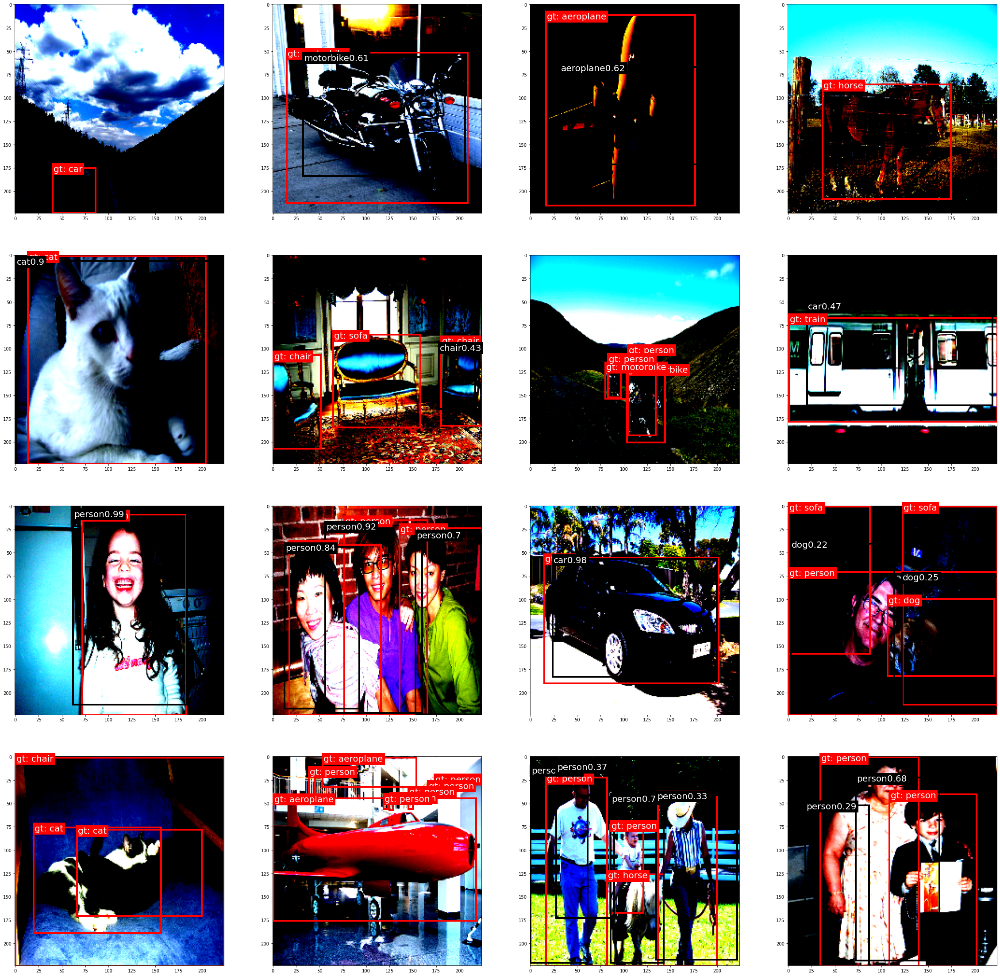

In [29]:
from collections import namedtuple


Prediction = namedtuple("Prediction", ["probability", "class_id","classname", "bounding_box"])

batch = next(iter(val_loader))
img = batch[0].to(device)
bbs = batch[1]
classes = batch[2]
model.eval()
preds = model(img)
loss = SSD_loss()
print(loss(preds, (bbs, classes)))

class_pred, loc_preds = preds


fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(40,40))
ax = ax.flatten()
for j in range(len(ax)):
    pred_bbs = anchor_centers_to_corners(invert_transformation(loc_preds[j], anchors).detach())
    probabilities = F.softmax(class_pred[j], dim=1)
    class_predictions = torch.argmax(probabilities, dim=1)
    #print(class_predictions)


    predictions = []
    for i in range(len(pred_bbs)):
        if class_predictions[i] != 0:
            prediction = Prediction(
                probability=torch.max(probabilities[i]),
                class_id=class_predictions[i].item(),
                classname=cats[class_predictions[i].item()],
                bounding_box=(pred_bbs[i]).cpu()*224
            )
            predictions.append(prediction)
    predictions = sorted(predictions, key=lambda pred: pred.probability, reverse=True)
    predictions = non_max_suppression(predictions)
    model.train()

    ax[j].imshow(chw_to_hwc(img[j].cpu()))

    for i, bb in enumerate(anchor_centers_to_corners(bbs[j])):

        bb = (bb*224).cpu().squeeze(0)
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='red', facecolor='none')
        ax[j].text(bb[0]+1, bb[1]+4, 'gt: '+cats[classes[j][i].item()], c='white', size=20, bbox=dict(facecolor='red', edgecolor='none'))
        ax[j].add_patch(rect)   

    for pred in predictions:
        bb = pred.bounding_box
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='black', facecolor='none')
        ax[j].text(bb[0]+1, bb[1]+4, pred.classname + str(round(pred.probability.item(), 2)), c='white', size=20, bbox=dict(facecolor='black', edgecolor='none'))
        ax[j].add_patch(rect)   




(tensor(6.0037, device='cuda:0', grad_fn=<AddBackward0>), tensor(0.1135, device='cuda:0', grad_fn=<DivBackward0>), tensor(4.8682, device='cuda:0', grad_fn=<DivBackward0>))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

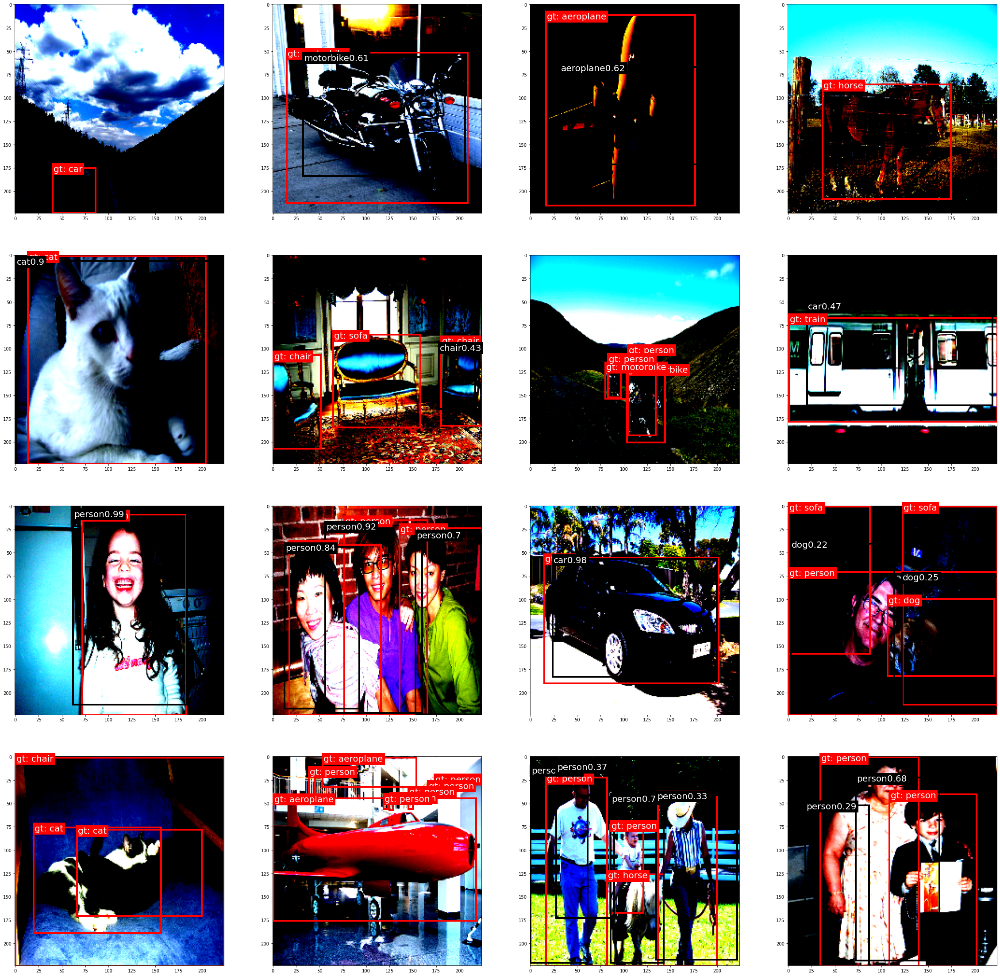

In [31]:
from collections import namedtuple


Prediction = namedtuple("Prediction", ["probability", "class_id","classname", "bounding_box"])

#batch = next(iter(val_loader))
img = batch[0].to(device)
bbs = batch[1]
classes = batch[2]
model.eval()
preds = model(img)
loss = SSD_loss()
print(loss(preds, (bbs, classes)))

class_pred, loc_preds = preds


fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(40,40))
ax = ax.flatten()
for j in range(len(ax)):
    pred_bbs = anchor_centers_to_corners(invert_transformation(loc_preds[j], anchors).detach())
    probabilities = F.softmax(class_pred[j], dim=1)
    class_predictions = torch.argmax(probabilities, dim=1)
    #print(class_predictions)


    predictions = []
    for i in range(len(pred_bbs)):
        if class_predictions[i] != 0:
            prediction = Prediction(
                probability=torch.max(probabilities[i]),
                class_id=class_predictions[i].item(),
                classname=cats[class_predictions[i].item()],
                bounding_box=(pred_bbs[i]).cpu()*224
            )
            predictions.append(prediction)
    predictions = sorted(predictions, key=lambda pred: pred.probability, reverse=True)
    predictions = non_max_suppression(predictions)
    model.train()

    ax[j].imshow(chw_to_hwc(img[j].cpu()))

    for i, bb in enumerate(anchor_centers_to_corners(bbs[j])):

        bb = (bb*224).cpu().squeeze(0)
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='red', facecolor='none')
        ax[j].text(bb[0]+1, bb[1]+4, 'gt: '+cats[classes[j][i].item()], c='white', size=20, bbox=dict(facecolor='red', edgecolor='none'))
        ax[j].add_patch(rect)   

    for pred in predictions:
        bb = pred.bounding_box
        rect = patches.Rectangle(bb[:2], bb[2],bb[3], linewidth=4, edgecolor='black', facecolor='none')
        ax[j].text(bb[0]+1, bb[1]+4, pred.classname + str(round(pred.probability.item(), 2)), c='white', size=20, bbox=dict(facecolor='black', edgecolor='none'))
        ax[j].add_patch(rect)   




In [33]:
DIR = Path('./models/')
for file in DIR.iterdir():
    print(file)

NameError: name 'Path' is not defined

In [17]:
def non_max_suppression(predictions: list, iou_threshold: float = 0.5, top_k: int = 100) -> list:
    '''
    Takes a sorted (by probabilities) list of predictions. Removes overlapping predictions and 
    keeps the ones with the highest probabilities
    '''
    filtered_bb = []
    while len(predictions[:top_k]) != 0: # As long 
        best_pred = predictions.pop(0)
        filtered_bb.append(best_pred)
        removable_predictions = []
        for pred in predictions:
            iou_score = iou(best_pred.bounding_box.unsqueeze(0), pred.bounding_box.unsqueeze(0))
            if iou_score > iou_threshold:
                removable_predictions.append(pred)
        predictions = [pred for pred in predictions if pred not in removable_predictions]
    return filtered_bb

In [ ]:
class MAP2:
    def __init__(self, model, dataset, jaccard_threshold, anchors):
        self.jaccard_threshold = jaccard_threshold
        self.model = model
        self.eps = np.finfo(np.float32).eps
        self.anchors = anchors
        self.dataset = dataset

    @staticmethod
    def voc_ap(rec, prec):
        """Compute VOC AP given precision and recall with the VOC-07 11-point method."""

        ap = 0.0
        for t in np.arange(0.0, 1.1, 0.1):
            if np.sum(rec >= t) == 0:
                p = 0.0
            else:
                p = np.max(prec[rec >= t])
            ap = ap + p / 11.0
        return ap

    def __call__(self):
        self.model.eval()
        aps = defaultdict(list)
        runs = 0
        for i in range(len(self.dataset)):
            
            (x, target) = self.dataset[i]
            x, target = x.to(device), torch.Tensor(target).to(device)
            bb_true= target[:,:4]
            class_true = target[:,4:]
            class_true = class_true.squeeze(0) - 1 # -1 to convert it from 1-21 to 0-20

            x = x[None, :, :, :]
            class_hat, bb_hat = self.model(x)
            class_hat = class_hat[0, :, 1:].sigmoid()
            
            bb_hat = invert_transformation(bb_hat.squeeze(0), self.anchors)
            jacard_values = iou(bb_hat, bb_true)
            for j in range(len(class_true)):
                overlap = (jacard_values[:, j] > self.jaccard_threshold).nonzero()
                class_true_j = int(class_true[j].detach().cpu().numpy())
                runs += 1
                #print(runs)
                if len(overlap) > 0:
                    class_hat_j = class_hat[overlap[:,0], :]
                    prob, class_id = class_hat_j.max(1)
                    prob, sort_index = torch.sort(prob, descending=True)
                    class_id = class_id[sort_index].detach().cpu().numpy()
                    tp = np.zeros_like(class_id)
                    fp = np.zeros_like(class_id)

                    found = False
                    for d in range(len(class_id)):
                        if found or class_id[d] != class_true[j]:
                            fp[d] = 1.0
                        else:
                            tp[d] = 1.0
                            found = True

                    fp = np.cumsum(fp)
                    tp = np.cumsum(tp)

                    rec = tp
                    prec = tp / np.maximum(tp + fp, self.eps)

                    temp_ap = self.voc_ap(rec, prec)
                    aps[class_true_j].append(temp_ap)
                else:
                    aps[class_true_j].append(0)

        res_list = []
        for _, list_value in aps.items():
            res_list.append(sum(list_value) / len(list_value))

        return res_list, sum(res_list) / len(res_list)

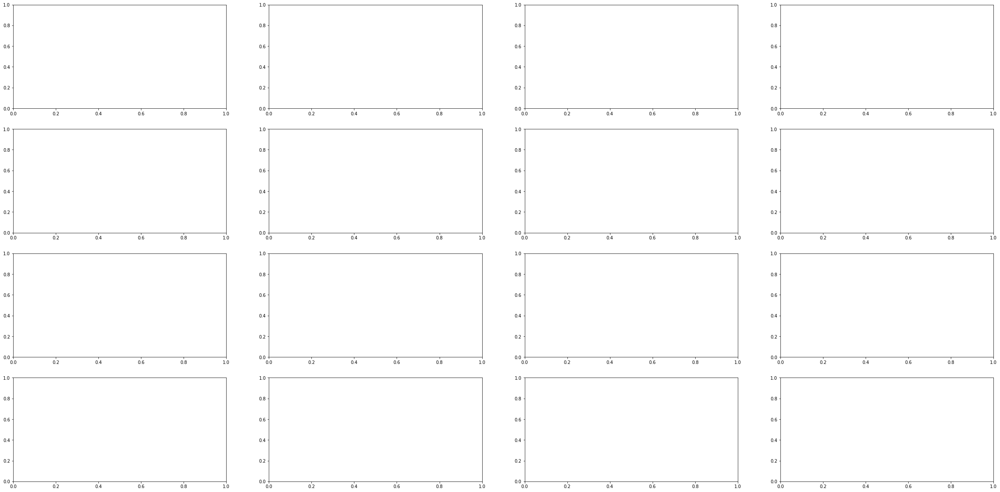

In [22]:
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(40,20))
ax = ax.flat

In [25]:
ax[0]

<AxesSubplot:>

In [34]:
for stat in DIR.iterdir():
    print(stat)

stats/.ipynb_checkpoints
stats/do-10-20-wd-1e2-150e10-07-2021-09:01.pkl
stats/do-15-30-wd-1e2-150e09-07-2021-17:50.pkl
stats/do-15-30-wd-0-150e09-07-2021-14:03.pkl
stats/do-20-50-wd-1e2-150e10-07-2021-01:26.pkl
stats/do-10-20-wd-0-150e10-07-2021-05:13.pkl
stats/do-20-50-wd-0-150e09-07-2021-21:38.pkl
stats/do-15-30-wd-0-150e09-07-2021-10:12.pkl


In [ ]:
x, bb_true, class_true = batch
x = x.to(device)
print(bb_true)
torch.Tensor(bb_true)
bb_true = bb_true.to(device)

In [ ]:
x = [torch.rand(1,4), torch.rand(1,4), torch.rand(1,4)]

In [ ]:
torch.stack(x)